In [119]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/dog-corgi/dog.jpg


In [120]:
import torch
import torchvision
import torchvision.transforms as transforms
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

import numpy as np
import pandas as pd
import torch.nn as nn
import torch.nn.functional as F

os.environ['CUDA_LAUNCH_BLOCKING'] = '1'
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Retina display
%config InlineBackend.figure_format = 'retina'

try:
    from einops import rearrange
except ImportError:
    %pip install einops
    from einops import rearrange
try:
    from einops import rearrange
except ImportError:
    %pip install einops
    from einops import rearrange

In [121]:
# Read in a image from torchvision
img = torchvision.io.read_image("../input/dog-corgi/dog.jpg")
print(img.shape)

torch.Size([3, 1365, 2048])


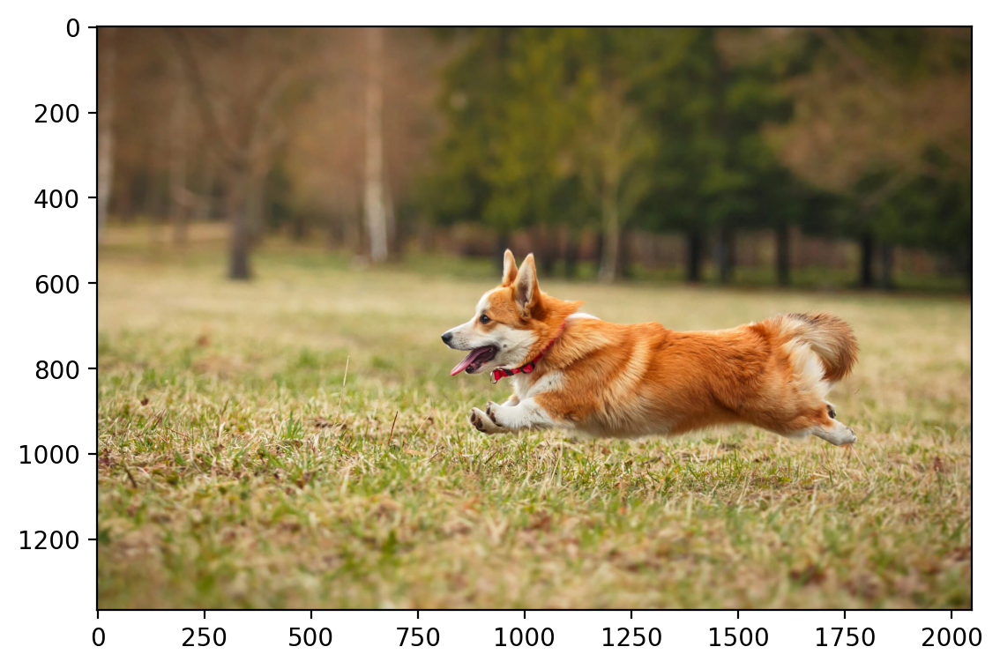

In [122]:
#original image
plt.imshow(rearrange(img, 'c h w -> h w c').numpy())

# # **PART-A**

In [123]:
#transforimg features
from sklearn import preprocessing

scaler_img = preprocessing.MinMaxScaler().fit(img.reshape(-1, 1))
img_scaled = scaler_img.transform(img.reshape(-1, 1)).reshape(img.shape)
img_scaled.shape

img_scaled = torch.tensor(img_scaled)


In [124]:
img_scaled = img_scaled.to(device)
img_scaled

tensor([[[0.3098, 0.3137, 0.3137,  ..., 0.2941, 0.2941, 0.2980],
         [0.3098, 0.3137, 0.3137,  ..., 0.2941, 0.2941, 0.2980],
         [0.3098, 0.3137, 0.3137,  ..., 0.2941, 0.2941, 0.2980],
         ...,
         [0.4745, 0.4745, 0.4784,  ..., 0.3804, 0.3765, 0.3765],
         [0.4745, 0.4745, 0.4784,  ..., 0.3804, 0.3804, 0.3765],
         [0.4745, 0.4745, 0.4784,  ..., 0.3843, 0.3804, 0.3804]],

        [[0.2039, 0.2078, 0.2078,  ..., 0.2157, 0.2157, 0.2118],
         [0.2039, 0.2078, 0.2078,  ..., 0.2157, 0.2157, 0.2118],
         [0.2039, 0.2078, 0.2078,  ..., 0.2157, 0.2157, 0.2118],
         ...,
         [0.4039, 0.4039, 0.4078,  ..., 0.3216, 0.3176, 0.3176],
         [0.4039, 0.4039, 0.4078,  ..., 0.3216, 0.3216, 0.3176],
         [0.4039, 0.4039, 0.4078,  ..., 0.3255, 0.3216, 0.3216]],

        [[0.1373, 0.1412, 0.1412,  ..., 0.1176, 0.1176, 0.1176],
         [0.1373, 0.1412, 0.1412,  ..., 0.1176, 0.1176, 0.1176],
         [0.1373, 0.1412, 0.1412,  ..., 0.1176, 0.1176, 0.

In [125]:
crop = torchvision.transforms.functional.crop(img_scaled.cpu(), 550, 825, 200, 200)
crop.shape

torch.Size([3, 200, 200])

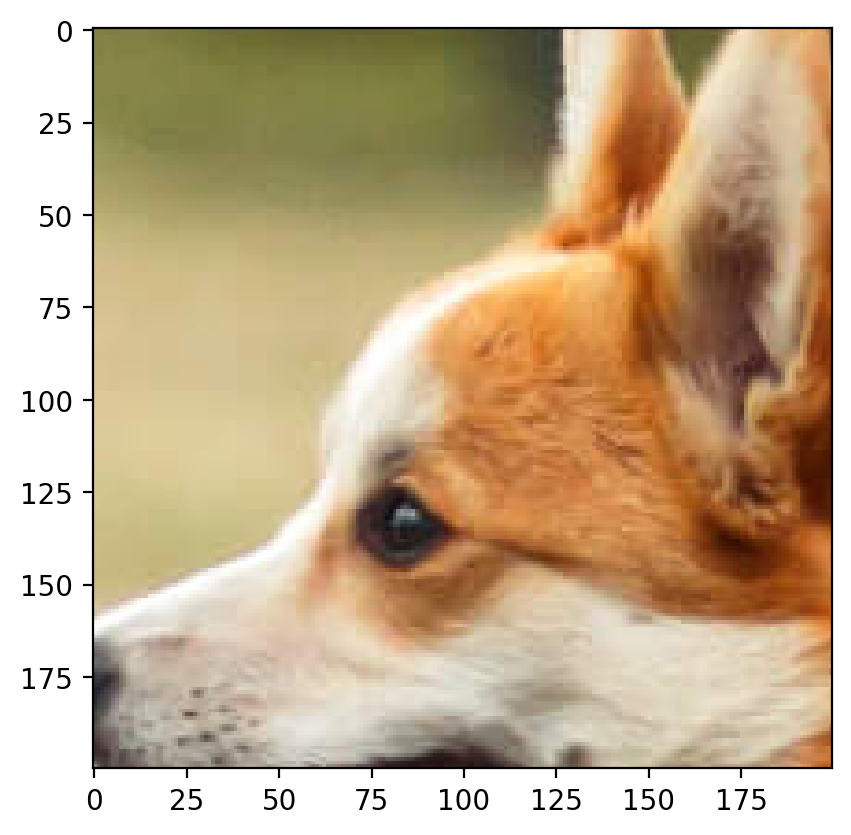

In [126]:
plt.imshow(rearrange(crop, 'c h w -> h w c').cpu().numpy())
crop = crop.to(device)

In [127]:
def create_coordinate_map(img, scale=1):
    """
    img: torch.Tensor of shape (num_channels, height, width)
    
    return: tuple of torch.Tensor of shape (height * width, 2) and torch.Tensor of shape (height * width, num_channels)
    """
    
    num_channels, height, width = img.shape
    
    # Create a 2D grid of (x,y) coordinates (h, w)
    # width values change faster than height values
    w_coords = torch.arange(0, width,  1/scale).repeat(int(height*scale), 1)
    h_coords = torch.arange(0, height, 1/scale).repeat(int(width*scale), 1).t()
    w_coords = w_coords.reshape(-1)
    h_coords = h_coords.reshape(-1)

    # Combine the x and y coordinates into a single tensor
    X = torch.stack([h_coords, w_coords], dim=1).float()

    # Move X to GPU if available
    X = X.to(device)

    # Reshape the image to (h * w, num_channels)
    Y = rearrange(img, 'c h w -> (h w) c').float()
    return X, Y

In [128]:
dog_X, dog_Y = create_coordinate_map(crop)

dog_X.shape, dog_Y.shape

(torch.Size([40000, 2]), torch.Size([40000, 3]))

In [129]:
# MinMaxScaler from -1 to 1
scaler_X = preprocessing.MinMaxScaler(feature_range=(-1, 1)).fit(dog_X.cpu())

# Scale the X coordinates
dog_X_scaled = scaler_X.transform(dog_X.cpu())

# Move the scaled X coordinates to the GPU
dog_X_scaled = torch.tensor(dog_X_scaled).to(device)

# Set to dtype float32
dog_X_scaled = dog_X_scaled.float()

In [130]:
class LinearModel(nn.Module):
    def __init__(self, in_features, out_features):
        super(LinearModel, self).__init__()
        self.linear = nn.Linear(in_features, out_features)
        
    def forward(self, x):
        return self.linear(x)
    

In [131]:
def train(net, lr, X, Y, epochs, verbose=True):
    """
    net: torch.nn.Module
    lr: float
    X: torch.Tensor of shape (num_samples, 2)
    Y: torch.Tensor of shape (num_samples, 3)
    """

    criterion = nn.MSELoss()
    optimizer = torch.optim.Adam(net.parameters(), lr=lr)
    for epoch in range(epochs):
        optimizer.zero_grad()
        outputs = net(X)
        
        
        loss = criterion(outputs, Y)
        loss.backward()
        optimizer.step()
        if verbose and epoch % 100 == 0:
            print(f"Epoch {epoch} loss: {loss.item():.6f}")
    return loss.item()

In [132]:
def plot_reconstructed_and_original_image(original_img, net, X, title=""):
    """
    net: torch.nn.Module
    X: torch.Tensor of shape (num_samples, 2)
    Y: torch.Tensor of shape (num_samples, 3)
    """
    num_channels, height, width = original_img.shape
    net.eval()
    with torch.no_grad():
        outputs = net(X)
        outputs = outputs.reshape(2*height, 2*width, num_channels)
        #outputs = outputs.permute(1, 2, 0)
    fig = plt.figure(figsize=(6, 4))
    gs = gridspec.GridSpec(1, 2, width_ratios=[1, 1])

    ax0 = plt.subplot(gs[0])
    ax1 = plt.subplot(gs[1])

    ax0.imshow(outputs.cpu())
    ax0.set_title("Reconstructed Image")
    

    ax1.imshow(original_img.cpu().permute(1, 2, 0))
    ax1.set_title("Original Image")
    
    for a in [ax0, ax1]:
        a.axis("off")


    fig.suptitle(title, y=0.9)
    plt.tight_layout()

In [133]:
# create RFF features
def create_rff_features(X, num_features, sigma, random_state = None):
    from sklearn.kernel_approximation import RBFSampler
    rff = RBFSampler(n_components=num_features, gamma=1/(2 * sigma**2),random_state=random_state)
    X = X.cpu().numpy()
    X = rff.fit_transform(X)
    return torch.tensor(X, dtype=torch.float32).to(device)

In [134]:
X_rff = create_rff_features(dog_X_scaled, 5000, 0.008,77)
X_rff.shape

torch.Size([40000, 5000])

In [135]:
net = LinearModel(X_rff.shape[1], 3)
net.to(device)

train(net, 0.01, X_rff, dog_Y, 1000)

Epoch 0 loss: 0.405610
Epoch 100 loss: 0.030812
Epoch 200 loss: 0.025316
Epoch 300 loss: 0.023118
Epoch 400 loss: 0.021740
Epoch 500 loss: 0.020821
Epoch 600 loss: 0.020189
Epoch 700 loss: 0.019746
Epoch 800 loss: 0.019433
Epoch 900 loss: 0.019211


0.01905844546854496

In [136]:
del(X_rff)
#creating coordinate map of scale 2
dog_2X,dog_2Y = create_coordinate_map(crop, scale=2)

In [137]:
# MinMaxScaler from -1 to 1
scaler_2X = preprocessing.MinMaxScaler(feature_range=(-1, 1)).fit(dog_2X.cpu())

# Scale the X coordinates
dog_2X_scaled = scaler_2X.transform(dog_2X.cpu())

# Move the scaled X coordinates to the GPU
dog_2X_scaled = torch.tensor(dog_2X_scaled).to(device)

# Set to dtype float32
dog_2X_scaled = dog_2X_scaled.float()

In [138]:
#creating featrues for upscaled image
X_2rff = create_rff_features(dog_2X_scaled, 5000, 0.008,random_state=77)
X_2rff.shape

torch.Size([160000, 5000])

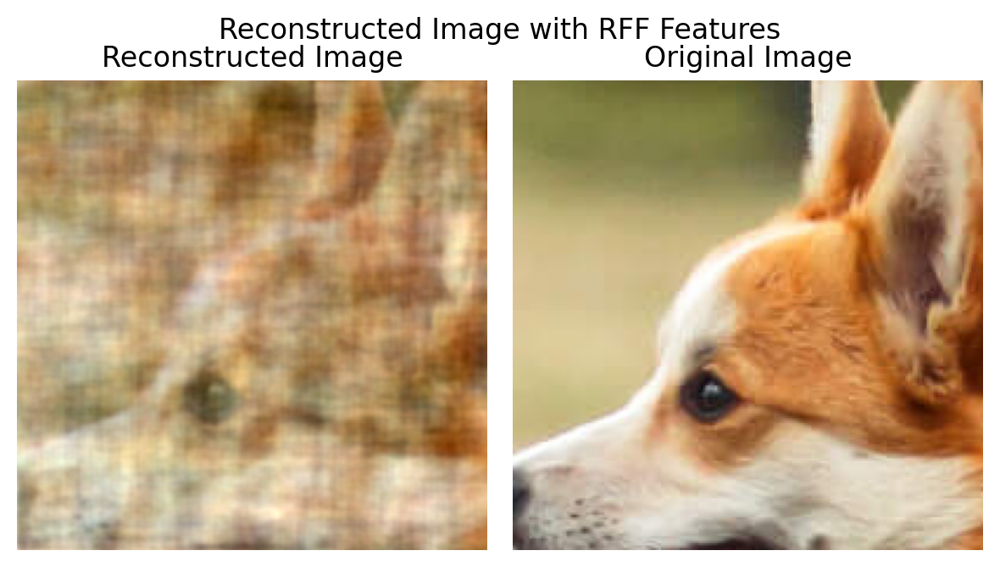

In [139]:
#Plotting orignial and reconstructed image
plot_reconstructed_and_original_image(crop, net, X_2rff, title="Reconstructed Image with RFF Features")
del(X_2rff)
del(net)

 # **Analysis of Results:**
 
Upon applying super-resolution to enhance an image's resolution by a factor of 2, the expected qualitative comparison would show:

- **Original Image:** Appears blurrier with less defined features.
- **Reconstructed Image:** Displays increased detail and sharper edges.

> **Reason:** Super-resolution algorithms predict and add pixel information to improve image clarity and definition. However, the process is limited by the original image's information and may introduce artifacts.

# # **PART-B**

Text(0.5, 1.0, '400*400 original image')

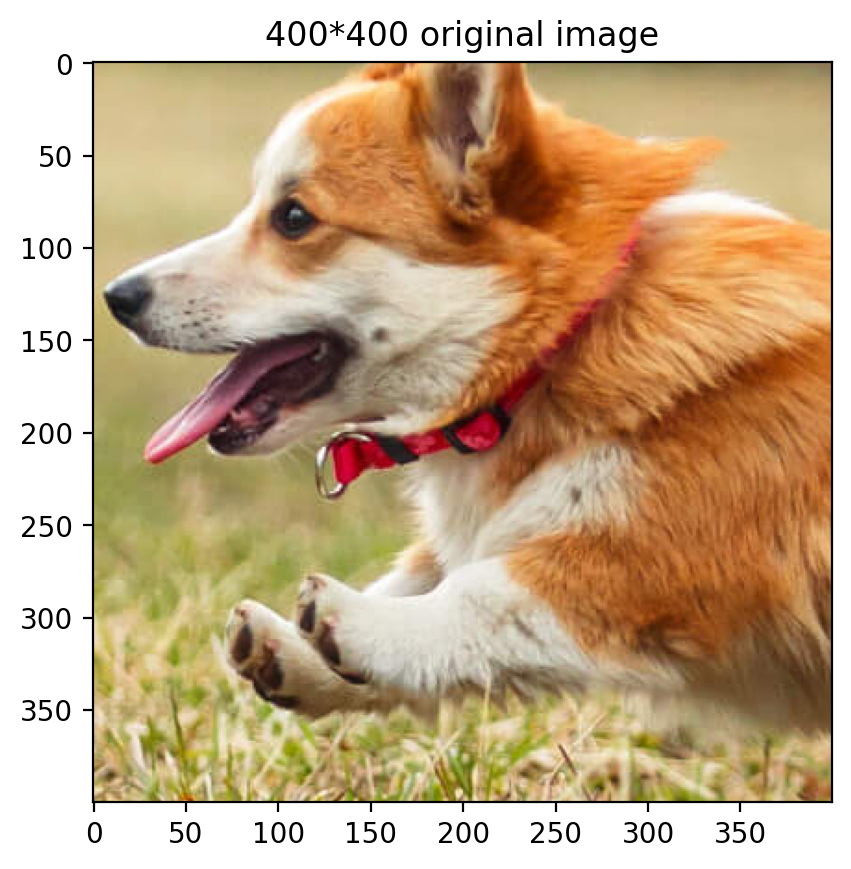

In [140]:
crop2 = torchvision.transforms.functional.crop(img_scaled.cpu(), 600, 800, 400, 400)
crop2 = crop2.to(device)
plt.imshow(rearrange(crop2, 'c h w -> h w c').cpu().numpy())
plt.title("400*400 original image")

/opt/conda/lib/python3.10/site-packages/torchvision/transforms/functional.py:1603: UserWarning: The default value of the antialias parameter of all the resizing transforms (Resize(), RandomResizedCrop(), etc.) will change from None to True in v0.17, in order to be consistent across the PIL and Tensor backends. To suppress this warning, directly pass antialias=True (recommended, future default), antialias=None (current default, which means False for Tensors and True for PIL), or antialias=False (only works on Tensors - PIL will still use antialiasing). This also applies if you are using the inference transforms from the models weights: update the call to weights.transforms(antialias=True).
  warnings.warn(


Text(0.5, 1.0, 'Resized image 200*200')

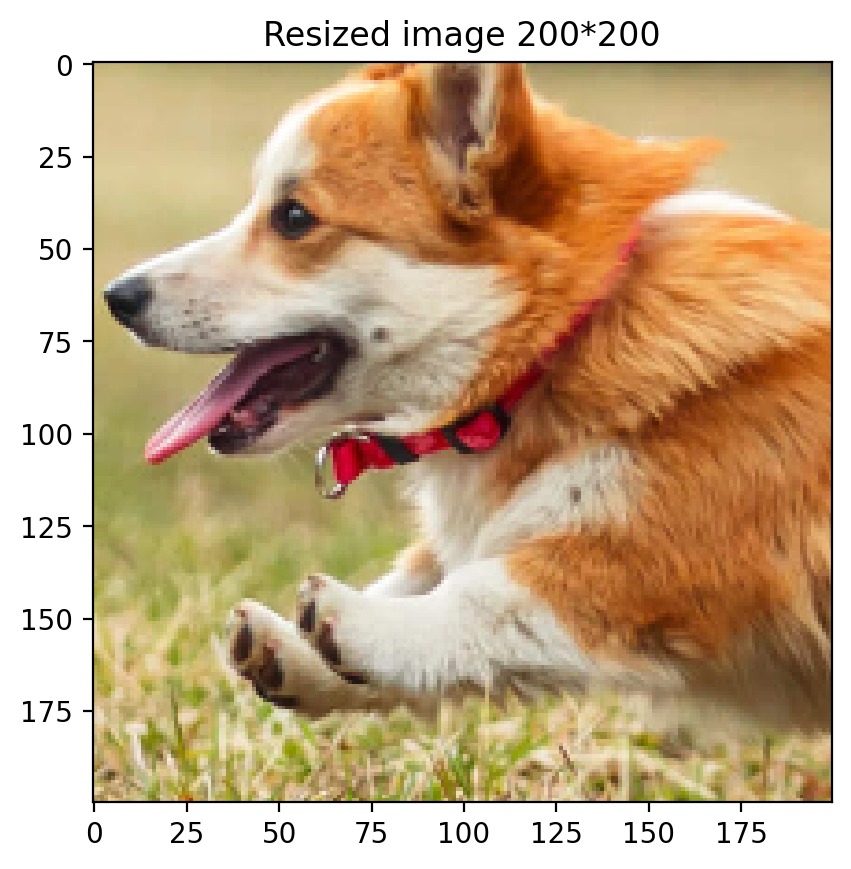

In [141]:
resized_img = torchvision.transforms.functional.resize(crop2,(200,200))
resized_img.shape
plt.imshow((rearrange(resized_img,'c h w -> h w c')).cpu().numpy())
resized_img = resized_img.to(device)
plt.title("Resized image 200*200")

In [142]:
resized_img.shape

torch.Size([3, 200, 200])

In [143]:
#Creating cooridnate map
resized_X, resized_Y = create_coordinate_map(resized_img)

resized_X.shape, resized_Y.shape

(torch.Size([40000, 2]), torch.Size([40000, 3]))

In [144]:
# MinMaxScaler from -1 to 1
scaler_X = preprocessing.MinMaxScaler(feature_range=(-1, 1)).fit(resized_X.cpu())

# Scale the X coordinates
resized_X_scaled = scaler_X.transform(resized_X.cpu())

# Move the scaled X coordinates to the GPU
resized_X_scaled = torch.tensor(resized_X_scaled).to(device)

# Set to dtype float32
resized_X_scaled = resized_X_scaled.float()

In [145]:
#Creating features of the resized image
resized_rff = create_rff_features(resized_X_scaled, 5000, 0.008,77)
resized_rff.shape

torch.Size([40000, 5000])

In [146]:
#training the model on the resized image
net = LinearModel(resized_rff.shape[1], 3)
net.to(device)

train(net, 0.01, resized_rff, resized_Y, 1000)

Epoch 0 loss: 0.377579
Epoch 100 loss: 0.027847
Epoch 200 loss: 0.024761
Epoch 300 loss: 0.023636
Epoch 400 loss: 0.022933
Epoch 500 loss: 0.022482
Epoch 600 loss: 0.022195
Epoch 700 loss: 0.022013
Epoch 800 loss: 0.021899
Epoch 900 loss: 0.021827


0.02178185246884823

In [147]:
#creating new coordinate map for 400*400 image
resized_2X,resized_2Y = create_coordinate_map(resized_img, scale=2)

In [148]:
# MinMaxScaler from -1 to 1
scaler_2X = preprocessing.MinMaxScaler(feature_range=(-1, 1)).fit(resized_2X.cpu())

# Scale the X coordinates
resized_2X_scaled = scaler_2X.transform(resized_2X.cpu())

# Move the scaled X coordinates to the GPU
resized_2X_scaled = torch.tensor(resized_2X_scaled).to(device)

# Set to dtype float32
resized_2X_scaled = resized_2X_scaled.float()

In [149]:
#Creating features for upscaled image
resized_2rff = create_rff_features(resized_2X_scaled, 5000, 0.008,random_state=77)
resized_2rff.shape


torch.Size([160000, 5000])

In [150]:
 def plot_images(reconst_img, resized_img, original_image, title=""):
    fig = plt.figure(figsize=(18, 6))  # Adjust the size as needed
    gs = gridspec.GridSpec(1, 3, width_ratios=[1, 1, 1])

    ax0 = plt.subplot(gs[0])
    ax0.imshow(original_image.cpu().permute(1,2,0))
    ax0.set_title('Original Image')

    ax1 = plt.subplot(gs[1])
    ax1.imshow(resized_img.cpu().permute(1,2,0))
    ax1.set_title('Resized Image')

    ax2 = plt.subplot(gs[2])
    ax2.imshow(reconst_img.cpu().permute(0,1,2))
    ax2.set_title('Reconstructed Image')

    plt.suptitle(title)
    plt.show()


In [151]:
#function to calculate the output
def reconstructedOutput(resized_img,net, X):
    num_channels, height, width = resized_img.shape
    num_channels, height, width = num_channels, 2*height, 2*width
    net.eval()
    with torch.no_grad():
        outputs = net(X)
        outputs = outputs.reshape(height, width, num_channels)
    return outputs

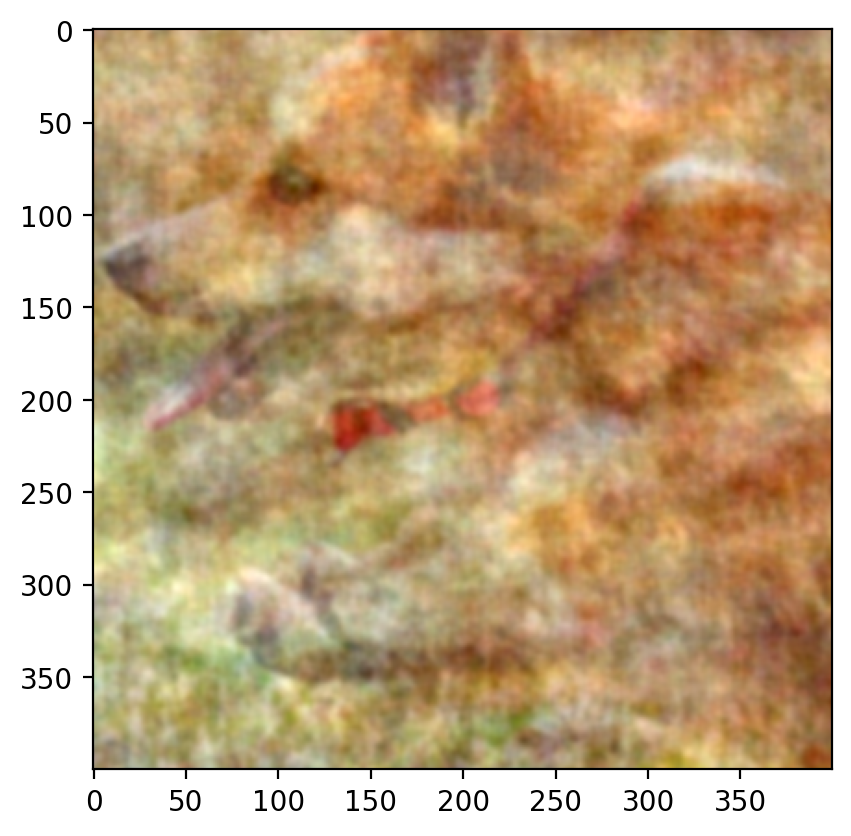

In [152]:
#Reconstruced image using resized image
reconst_img = reconstructedOutput(resized_img,net,resized_2rff)
img_cpu = reconst_img.cpu()
plt.imshow(img_cpu.permute(0,1,2))
plt.show()


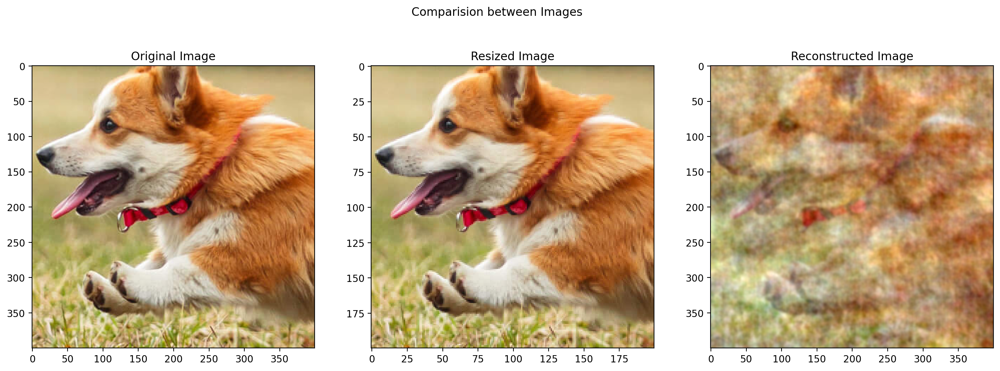

In [153]:
plot_images(reconst_img, resized_img, crop2,title="Comparision between Images")

In [154]:
#Calculating metrics for reconstructed and original image
diff = crop2.permute(1,2,0) - reconst_img
mse = torch.mean(diff**2)

#RMSE
rmse = torch.sqrt(mse)   
print(f"RMSE: {rmse.item()}")
print()
# Calculate PSNR
max_pixel_value = 255.0
psnr = 20 * torch.log10(max_pixel_value / torch.sqrt(mse))
print(f'PSNR: {psnr.item()}')

RMSE: 0.1493822693538795

PSNR: 64.6448225531665


# **Analysis of Results:**

In a quantitative analysis of super-resolution on an image, we'd expect:
> - **RMSE**: A lower RMSE would indicate that the predicted high-resolution image closely matches the ground truth, suggesting a successful enhancement.
> - **Peak SNR**: A higher Peak SNR would suggest that the enhanced image maintains a high level of detail relative to the noise introduced by the upscaling process.

These metrics provide a numerical assessment of the super-resolution process's accuracy and quality.



In [155]:
del(resized_2rff)
del(resized_img)
del(crop2)
del(net)

# **PART-C**

In [156]:
#Function to generate coordinate map according to the sample percent

def generate_map(image, sample_percent):
    channels, img_height, img_width = image.shape
    total_pixels = img_height * img_width
    sampled_pixels = int(total_pixels * sample_percent)
    random_indices = torch.randperm(total_pixels)[:sampled_pixels]

    width_coords = random_indices % img_width
    height_coords = random_indices // img_width
    coords = torch.stack([height_coords, width_coords], dim=1).float()
    coords = coords.to(image.device)
    pixel_values = rearrange(image, 'c h w -> (h w) c').float()
    sampled_values = pixel_values[random_indices, :]

    return coords, sampled_values, height_coords, width_coords,channels

In [157]:
def generateOutput(original_img, net, X):
    num_channels, height, width = original_img.shape
    net.eval()
    with torch.no_grad():
        outputs = net(X)
        outputs = outputs.reshape(height, width, num_channels)
    return outputs

In [158]:
def create_sparse_tensor(coords, sampled_values, img_height, img_width, channels):
    # Initialize a tensor filled with zeros that has the same size as the original image
    sparse_tensor = torch.zeros(channels, img_height, img_width, device=sampled_values.device)

    # Convert the flat indices to actual coordinates in the image
    for i, (y, x) in enumerate(coords):
        sparse_tensor[:, y.long(), x.long()] = sampled_values[i]

    return sparse_tensor

# Example usage:
# coords, sampled_values, _, _ = generate_map(image, sample_percent)
# sparse_image = create_sparse_tensor(coords, sampled_values, img_height, img_width, channels)


In [159]:
def scale_tensor_to_device(input_tensor, device, feature_range=(-1, 1)):
    # Ensure the input tensor is on CPU for the scaler
    input_tensor_cpu = input_tensor.cpu()
    
    # Create and fit the scaler
    scaler = preprocessing.MinMaxScaler(feature_range=feature_range).fit(input_tensor_cpu)
    
    # Scale the tensor
    input_tensor_scaled = scaler.transform(input_tensor_cpu)
    
    # Convert the scaled array back to a tensor and move to the specified device
    input_tensor_scaled = torch.tensor(input_tensor_scaled, device=device).float()
    
    return input_tensor_scaled

# Example usage:
# dog_X_scaled = scale_tensor_to_device(dog_X, device)


In [160]:
dog_Xorg, dog_Yorg = create_coordinate_map(crop)
dog_Xorg_scaled = scale_tensor_to_device(dog_Xorg, device)
dog_Xorg_scaled.shape

torch.Size([40000, 2])

Training for 10.00000% of the data
Epoch 0 loss: 0.408889
Epoch 100 loss: 0.028765
Epoch 200 loss: 0.007643
Epoch 300 loss: 0.003678
Epoch 400 loss: 0.002098
Epoch 500 loss: 0.001292
Epoch 600 loss: 0.000832
Epoch 700 loss: 0.000551
Epoch 800 loss: 0.000372
Epoch 900 loss: 0.000254


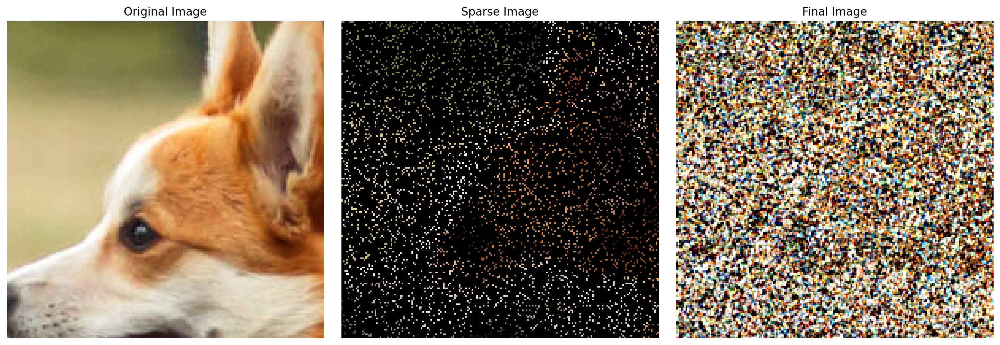

ERROR ANALYSIS:
RMSE: 0.44771
PSNR: 55.11089



Training for 20.00000% of the data
Epoch 0 loss: 0.408223
Epoch 100 loss: 0.051302
Epoch 200 loss: 0.021292
Epoch 300 loss: 0.015010
Epoch 400 loss: 0.012615
Epoch 500 loss: 0.011395
Epoch 600 loss: 0.010653
Epoch 700 loss: 0.010147
Epoch 800 loss: 0.009772
Epoch 900 loss: 0.009479


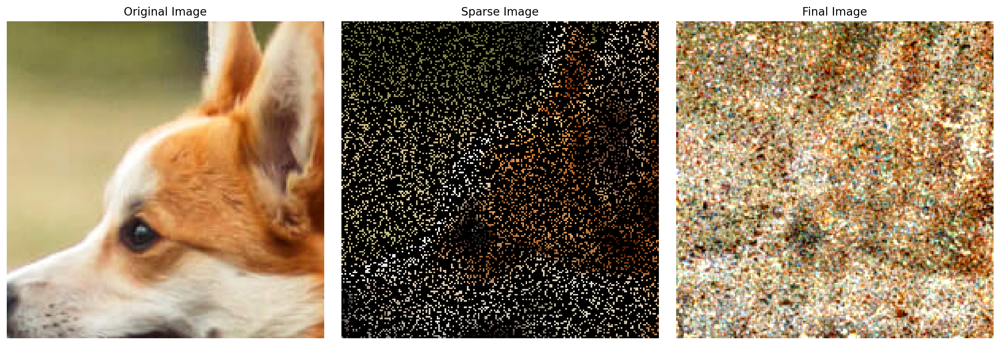

ERROR ANALYSIS:
RMSE: 0.23399
PSNR: 60.74694



Training for 30.00000% of the data
Epoch 0 loss: 0.399559
Epoch 100 loss: 0.059537
Epoch 200 loss: 0.025746
Epoch 300 loss: 0.019519
Epoch 400 loss: 0.017476
Epoch 500 loss: 0.016420
Epoch 600 loss: 0.015702
Epoch 700 loss: 0.015151
Epoch 800 loss: 0.014709
Epoch 900 loss: 0.014347


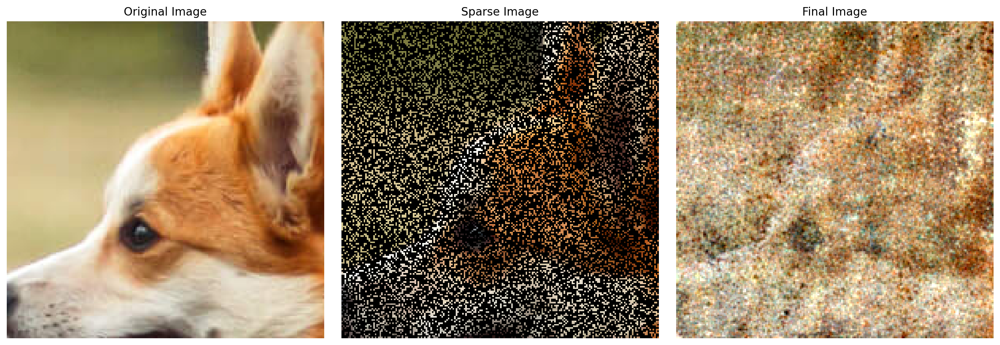

ERROR ANALYSIS:
RMSE: 0.18462
PSNR: 62.80542



Training for 40.00000% of the data
Epoch 0 loss: 0.407974
Epoch 100 loss: 0.067406
Epoch 200 loss: 0.027969
Epoch 300 loss: 0.021933
Epoch 400 loss: 0.020117
Epoch 500 loss: 0.019049
Epoch 600 loss: 0.018258
Epoch 700 loss: 0.017639
Epoch 800 loss: 0.017143
Epoch 900 loss: 0.016741


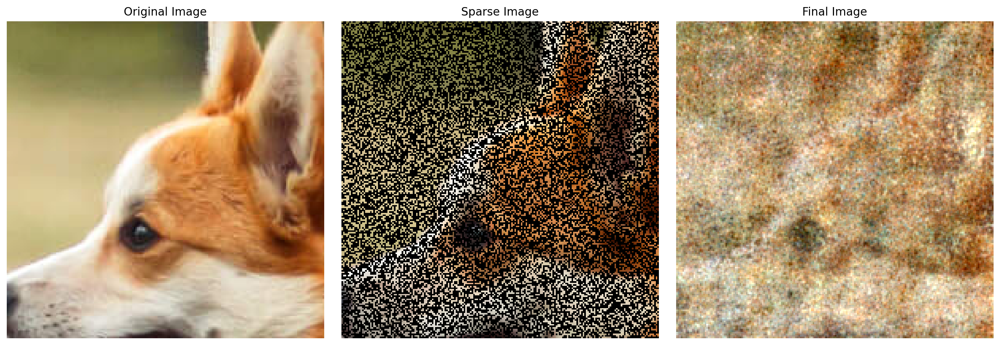

ERROR ANALYSIS:
RMSE: 0.16575
PSNR: 63.74151



Training for 50.00000% of the data
Epoch 0 loss: 0.394642
Epoch 100 loss: 0.067837
Epoch 200 loss: 0.028586
Epoch 300 loss: 0.023325
Epoch 400 loss: 0.021625
Epoch 500 loss: 0.020510
Epoch 600 loss: 0.019663
Epoch 700 loss: 0.018994
Epoch 800 loss: 0.018458
Epoch 900 loss: 0.018023


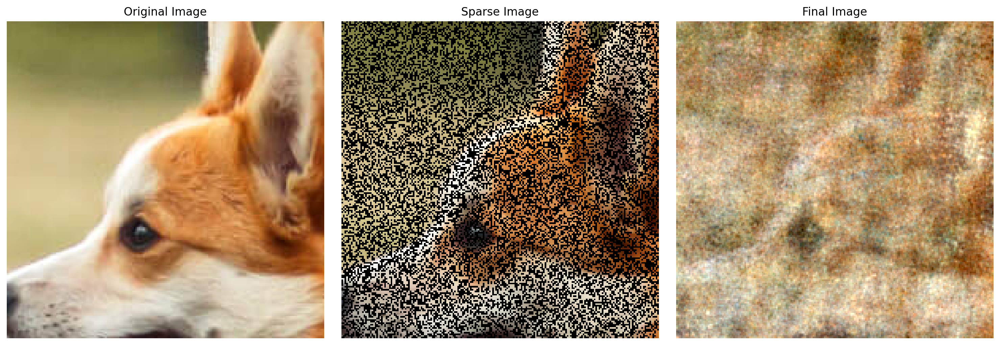

ERROR ANALYSIS:
RMSE: 0.15748
PSNR: 64.18615



Training for 60.00000% of the data
Epoch 0 loss: 0.409035
Epoch 100 loss: 0.074444
Epoch 200 loss: 0.030147
Epoch 300 loss: 0.024522
Epoch 400 loss: 0.022772
Epoch 500 loss: 0.021616
Epoch 600 loss: 0.020735
Epoch 700 loss: 0.020038
Epoch 800 loss: 0.019476
Epoch 900 loss: 0.019019


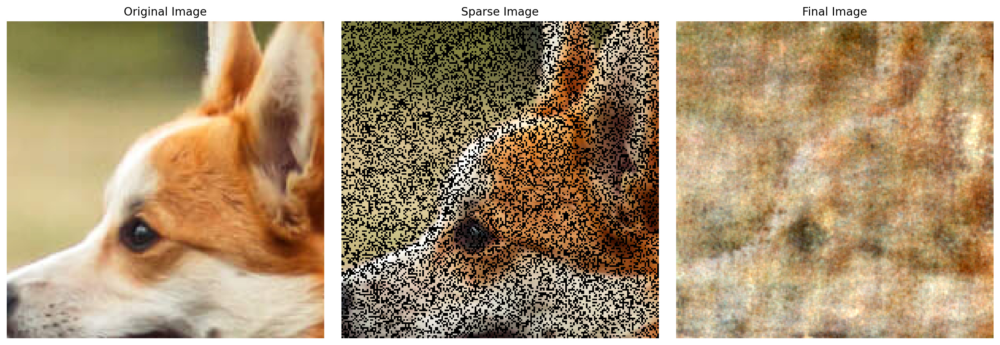

ERROR ANALYSIS:
RMSE: 0.15292
PSNR: 64.44149



Training for 70.00000% of the data
Epoch 0 loss: 0.394456
Epoch 100 loss: 0.071011
Epoch 200 loss: 0.030008
Epoch 300 loss: 0.025267
Epoch 400 loss: 0.023582
Epoch 500 loss: 0.022415
Epoch 600 loss: 0.021520
Epoch 700 loss: 0.020810
Epoch 800 loss: 0.020238
Epoch 900 loss: 0.019772


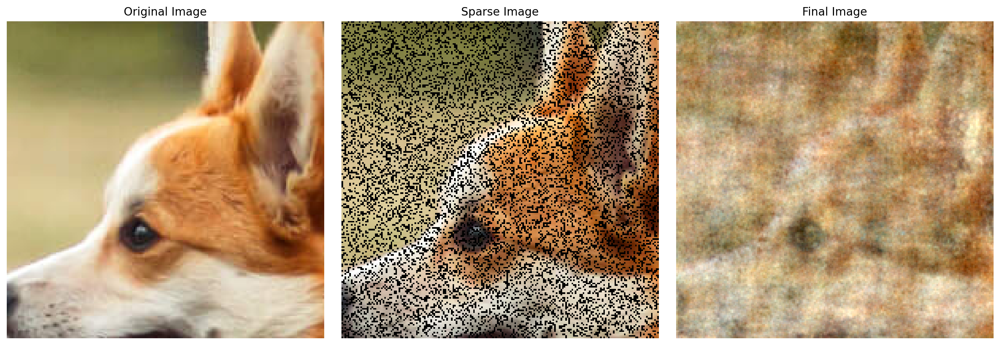

ERROR ANALYSIS:
RMSE: 0.14921
PSNR: 64.65468



Training for 80.00000% of the data
Epoch 0 loss: 0.399609
Epoch 100 loss: 0.073078
Epoch 200 loss: 0.030667
Epoch 300 loss: 0.025888
Epoch 400 loss: 0.024145
Epoch 500 loss: 0.022934
Epoch 600 loss: 0.022008
Epoch 700 loss: 0.021276
Epoch 800 loss: 0.020688
Epoch 900 loss: 0.020211


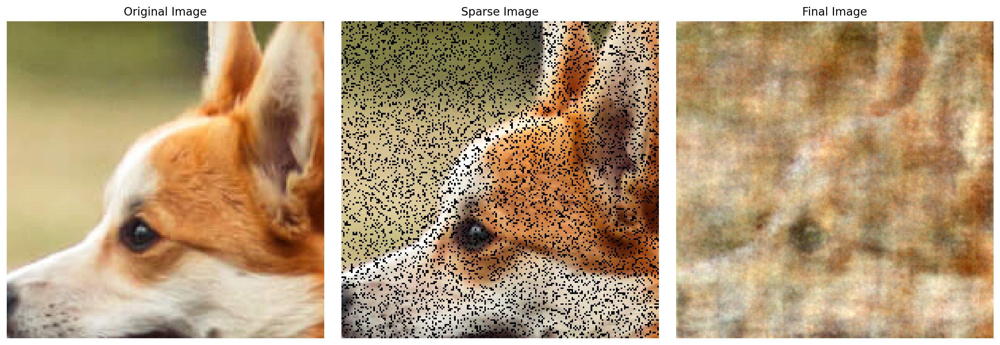

ERROR ANALYSIS:
RMSE: 0.14680
PSNR: 64.79609



Training for 90.00000% of the data
Epoch 0 loss: 0.405261
Epoch 100 loss: 0.076077
Epoch 200 loss: 0.031567
Epoch 300 loss: 0.026551
Epoch 400 loss: 0.024768
Epoch 500 loss: 0.023530
Epoch 600 loss: 0.022580
Epoch 700 loss: 0.021829
Epoch 800 loss: 0.021224
Epoch 900 loss: 0.020732


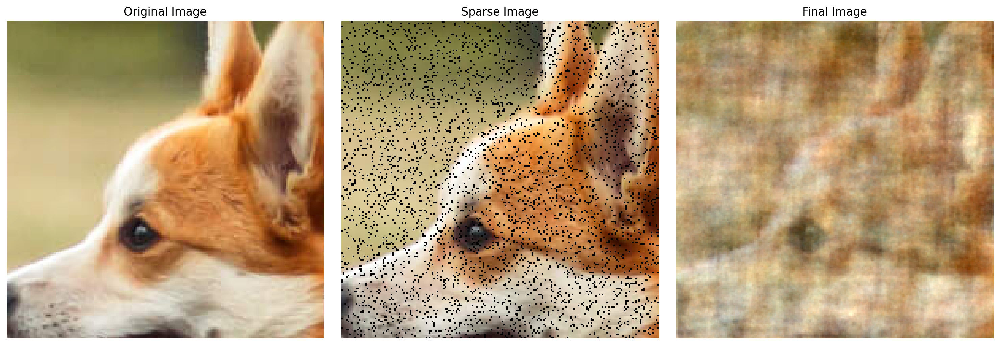

ERROR ANALYSIS:
RMSE: 0.14517
PSNR: 64.89338





In [165]:
percent = np.arange(0.1, 1, 0.1)
original_image = crop.cpu().permute(1, 2, 0)  

for i, p in enumerate(percent):
    print(f"Training for {p*100:.5f}% of the data")
    dog_X, dog_Y, h_coords, w_coords, num_channels = generate_map(crop, p)
    img_height = h_coords.max().item() + 1
    img_width = w_coords.max().item() + 1
    sparse_img = create_sparse_tensor(dog_X, dog_Y, img_height, img_width, num_channels)

    # Scale, train, and generate the final image
    dog_X_scaled = scale_tensor_to_device(dog_X, device)
    X_rff = create_rff_features(dog_X_scaled, 5000, 0.008, 77)
    net = LinearModel(X_rff.shape[1], 3)
    net.to(device)
    train(net, 0.005, X_rff, dog_Y, 1000)
    del(X_rff)
    Xorg_rff = create_rff_features(dog_Xorg_scaled, 5000, 0.008, 77)
    final_img = generateOutput(crop, net, Xorg_rff)

    # Set up the subplots
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))

    # Plot the original image
    axes[0].imshow(original_image)
    axes[0].set_title('Original Image')
    axes[0].axis('off')

    # Plot the sparse image
    axes[1].imshow(sparse_img.cpu().permute(1, 2, 0))
    axes[1].set_title('Sparse Image')
    axes[1].axis('off')

    # Plot the final generated image
    axes[2].imshow(final_img.cpu().permute(0, 1, 2))
    axes[2].set_title('Final Image')
    axes[2].axis('off')

    plt.tight_layout()
    plt.show()
    
    #Calculating metrics for reconstructed and original image
    diff = crop.permute(1,2,0) - final_img
    mse = torch.mean(diff**2)
    
    print("ERROR ANALYSIS:")
    #RMSE
    rmse = torch.sqrt(mse)   
    print(f"RMSE: {rmse.item():.5f}")
    
    # Calculate PSNR
    max_pixel_value = 255.0
    psnr = 20 * torch.log10(max_pixel_value / torch.sqrt(mse))
    print(f'PSNR: {psnr.item():.5f}')
    
    print("\n\n")


# **Analysis of Results:**

> - **Convergence and Quality**: As the percentage of missing data increases, the RFF model's ability to accurately reconstruct the image diminishes. This is evident from the progressive loss in image quality and increase in reconstruction error metrics like RMSE and lower PSNR values.
>   
> - **Model Limitations**: The model performs well with lower percentages of missing data (10%-30%), but struggles significantly as the missing data exceeds 50%, indicating a threshold beyond which RFF may not be suitable for image completion tasks.
> 
> - **Quantitative Metrics**: The quantitative metrics provide a clear indication of the model's performance, with lower RMSE and higher PSNR corresponding to better image reconstruction quality.
> 
> - **Practical Implications**: The experiment suggests that while RFF can be effective for completing images with small amounts of missing data, alternative methods may be necessary for more severely corrupted images.

In [ ]:
del(Xorg_rff)